## Temporal Context (Grid Image Generation)

In [ ]:
from data_loader import clip_path_loader
import torch
import torch.nn.functional as F
import cv2
from PIL import Image
import os
import numpy as np
import matplotlib.pyplot as plt
import warnings
import clip
from fastprogress import progress_bar
from sklearn import metrics
from scipy.ndimage import gaussian_filter1d
import cv2
import textwrap, re
from transformers import logging
from functions.key_func import key_frame_selection
from functions.chatunivi_func import load_lvlm, lvlm_test

warnings.filterwarnings(action='ignore')
logging.set_verbosity_error()

In [ ]:
def print_long_string(long_string, width=70):
    wrapped_string = textwrap.fill(long_string, width)
    print(wrapped_string)

def extract_numbers(file_name):
    numbers = re.findall(r'(\d+)', file_name)
    return tuple(map(int, numbers))

def transform2pil(image, transform=True):
    if transform:
        image = image * 255
        image = np.transpose(image, [1, 2, 0])
        image = (image).astype(np.uint8)
    image_pil = Image.fromarray(image)
    return image_pil

def show_pil_image(pil_image):
    pil_image = pil_image.resize((856, 480))
    plt.figure(figsize=(6, 6))
    plt.imshow(pil_image)
    plt.axis('off')
    plt.show()

In [ ]:
def extract_score(text):
    match = re.search(r'(\d+(\.\d+)?)', text)
    if match:
        return float(match.group(0))
    else:
        return 0.0

def generate_output(text):
    result = {
        "score": extract_score(text),
        "reason": text
    }
    return result

def min_max_normalize(arr, eps=1e-8):
    min_val = np.min(arr)
    max_val = np.max(arr)
    denominator = max_val - min_val + eps  # Avoid division by zero
    normalized_arr = (arr - min_val) / denominator
    return normalized_arr

def show_score_graph(answers_idx, scores, auc, x='Frame', y='Anomaly Score'):
    length = len(scores)
    plt.clf()
    plt.figure(figsize=(10, 5))
    plt.ylim([0.0, 1.0])
    plt.plot([num for num in range(length)],[score for score in scores], label=f'Predicted: AUC={auc:.3f}') # plotting
    plt.bar(answers_idx, max(scores), width=1, color='#BBCBE7',alpha=0.5, label='Ground-truth') # check answer
    plt.xlabel(x, fontsize=14)
    plt.ylabel(y, fontsize=14)
    plt.legend(fontsize=14)


---

1. Key frame selection

In [ ]:
def key_frame_selection_four_idx(clip_length, clip_path, anomaly_text, model, preprocess, device):
    images = [preprocess(Image.open(img_path)).unsqueeze(0).to(device) for img_path in clip_path]
    images = torch.cat(images)
    texts = clip.tokenize([anomaly_text for _ in range(1)]).to(device)

    with torch.no_grad():
        image_features = model.encode_image(images).float()
        text_features = model.encode_text(texts).float()

        image_features /= image_features.norm(dim=-1, keepdim=True)
        text_features /= text_features.norm(dim=-1, keepdim=True)
        similarity = (text_features @ image_features.T).cpu().numpy() # (1, clip_length)

        # key frames selection
        max_idx = np.argmax(similarity)
        group_len = clip_length // 4
        divide_output = max_idx % group_len

        first_idx = divide_output
        second_idx = group_len+divide_output
        third_idx = group_len*2+divide_output
        fourth_idx = group_len*3+divide_output

    return first_idx, second_idx, third_idx, fourth_idx

2. Grid Image Generation

In [ ]:
def split_images_with_unfold(image_paths, kernel_size=(80, 80), stride_size=None):
    all_patches = []

    for image_path in image_paths:
        image = cv2.imread(image_path)
        image = cv2.resize(image, (240, 240)).astype('float32')
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype('float32')
        image = (image / 255)
        image = torch.tensor(image).permute(2, 0, 1).unsqueeze(0).float()  # (H, W, C) -> (C, H, W) -> (1, C, H, W)

        if stride_size == None:
            stride_size = kernel_size

        org_patches = F.unfold(image, kernel_size=(kernel_size[0], kernel_size[1]), stride=(stride_size[0], stride_size[1]))
        patches = org_patches.permute(0, 2, 1).reshape(-1, 3, kernel_size[0], kernel_size[1])
        patches = F.interpolate(patches, size=(224, 224), mode='bilinear')
        all_patches.append(patches)

    grouped_patches = []
    num_patches = org_patches.shape[2]

    for i in range(num_patches):
        grouped_patches.append(torch.stack([patch_set[i] for patch_set in all_patches]))

    return grouped_patches

3. Grid Selection

In [ ]:
def patch_selection(gpatches, text, model, device):
    texts = clip.tokenize([text for _ in range(1)]).to(device)

    with torch.no_grad():
        text_features = model.encode_text(texts).float()
        max_arr = []

        for gpatch in gpatches:
            gpatch = gpatch.to(device)
            image_features = model.encode_image(gpatch).float()
            image_features /= image_features.norm(dim=-1, keepdim=True)
            text_features /= text_features.norm(dim=-1, keepdim=True)
            similarity = (text_features @ image_features.T).cpu().numpy() # (1, clip_length)
            max_arr.append(np.max(similarity))

        # key frames selection
        max_arr = np.array(max_arr)
        max_idx = np.argmax(max_arr)

    return max_idx

In [ ]:
def grid_image_generation(gpatches, idx):
    gpatch = gpatches[idx]
    grid_image = np.zeros((3, 224, 224), dtype=np.float32)
    grid_image[:, 0:112, 0:112] = F.interpolate(gpatch[0].unsqueeze(0), size=(112, 112), mode='bilinear').numpy()
    grid_image[:, 0:112, 112:224] = F.interpolate(gpatch[1].unsqueeze(0), size=(112, 112), mode='bilinear').numpy()
    grid_image[:, 112:224, 0:112] = F.interpolate(gpatch[2].unsqueeze(0), size=(112, 112), mode='bilinear').numpy()
    grid_image[:, 112:224, 112:224] = F.interpolate(gpatch[3].unsqueeze(0), size=(112, 112), mode='bilinear').numpy()
    return grid_image

In [ ]:
def grid_generation(image_paths, keyword, clip_model, device):
    gpatches_img = split_images_with_unfold(image_paths, kernel_size=(240, 240)) # 1x1
    gpatches_lge = split_images_with_unfold(image_paths, kernel_size=(120, 120)) # 2x2
    gpatches_mid = split_images_with_unfold(image_paths, kernel_size=(80, 80)) # 3x3
    gpatches_sml = split_images_with_unfold(image_paths, kernel_size=(60, 60)) # 4x4

    gpatches = [gpatch for gpatch in gpatches_img]
    gpatches += [gpatch for gpatch in gpatches_lge]
    gpatches += [gpatch for gpatch in gpatches_mid]
    gpatches += [gpatch for gpatch in gpatches_sml]

    max_patch_idx = patch_selection(gpatches, keyword, clip_model, device)
    grid_image = grid_image_generation(gpatches, max_patch_idx)
    output_image = transform2pil(grid_image)
    return output_image

----

## Load Model

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
clip_model, clip_preprocess = clip.load('ViT-B/32', device=device)

In [ ]:
# Model Parameter
model_path = "Chat-UniVi/weights/Chat-UniVi"  # or "Chat-UniVi/Chat-UniVi-13B"
tokenizer, lvlm_model, image_processor = load_lvlm(model_path)

Loading checkpoint shards: 100%|██████████| 2/2 [00:08<00:00,  4.18s/it]


### Compare (Anomaly Detection)

---

0. Setting

In [ ]:
video_name = '07_0049'
keyword = 'fighting'
clip_length = 16

In [ ]:
data_root = '/home/anonymous/datasets'
test_data_path = os.path.join(data_root, 'shanghai')
video_folder_path = os.path.join(test_data_path, 'testing', video_name)
video_label_path =  os.path.join(test_data_path, 'testframemask', f'{video_name}.npy')

video_folder_name = video_folder_path.split('/')[-1]
video = clip_path_loader(video_folder_path, clip_length)

print(keyword)
print(len(video))

fighting
30


In [ ]:
def make_instruction(keyword, temporal_context=False):
    if temporal_context == False:
        instruction = (
            f"- **Task**: Evaluate whether the given image includes **{keyword}** on a scale from 0 to 1. "
            f"A score of 1 means **{keyword}** is clearly present in the image, while a score of 0 means **{keyword}** is not present at all. "
            f"For intermediate cases, assign a value between 0 and 1 based on the degree to which **{keyword}** is visible.\n"
            f"- **Consideration**: The key is whether **{keyword}** is present in the image, not its focus. Thus, if **{keyword}** is present, even if it is not the main focus, assign a higher score like 1.0.\n"
            f"- **Response**: Provide the score as a float, rounded to one decimal place, including a brief reason for the score in **one short sentence**."
        )
    else:
        instruction = (
            f"- **Task**: Evaluate whether the given image includes **{keyword}** on a scale from 0 to 1."
            f"A score of 1 means **{keyword}** is clearly present in the image, while a score of 0 means **{keyword}** is not present at all. "
            f"For intermediate cases, assign a value between 0 and 1 based on the degree to which **{keyword}** is visible.\n"
            f"- **Context**: The given image represents a sequence (row 1 column 1 → row 1 column 2 → row 2 column 1 -> row 2 column 2) illustrating temporal progression.\n"
            f"- **Consideration**: The key is whether **{keyword}** is present in the image, not its focus. Thus, if **{keyword}** is present, even if it is not the main focus, assign a higher score like 1.0.\n"
            f"- **Response**: Provide the score as a float, rounded to one decimal place, including a brief reason for the score in **one short sentence**."
        )
    return instruction

---

1. Original frame --> Anomaly Detection

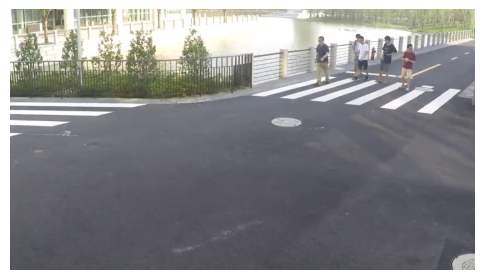

0 0.5
The image shows a group of people walking on a sidewalk near a lake, but there is no evidence of fighting. The presence of a small group of people and their casual stroll suggests that they are enjoying the scenery and having a peaceful time, rather than engaging in any aggressive behavior.


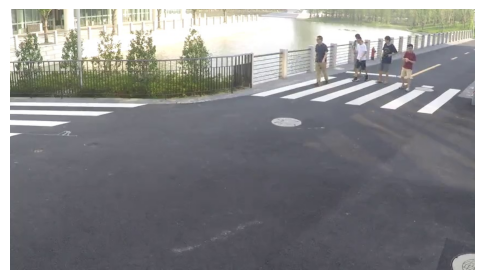

1 0.5
The image shows a group of people walking across a street, but there is no evidence of fighting. Although there are several people present, their actions are peaceful and not aggressive. The main focus of the image is the group of people crossing the street, and the presence of fighting is not a significant aspect of the scene.


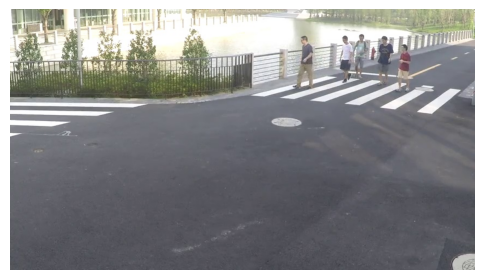

2 0.5
The image does not show any fighting, but there is a group of people walking across the street, which might suggest a disagreement or conflict. However, the image does not provide enough information to confidently determine if there is actually fighting happening.


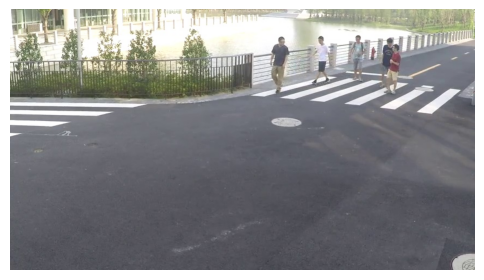

3 0.5
The image shows a group of people walking across a zebra crossing, but there is no evidence of fighting or any aggressive behavior. The presence of a car nearby might suggest a potential risk of conflict, but it does not actually depict any fighting. The people appear to be casually walking, and the overall atmosphere seems calm, so the score is set to 0.5, indicating that there is some minor potential for conflict but it is not actively happening in the image.


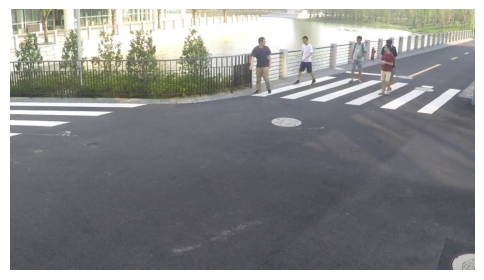

4 0.5
The image shows a group of people walking across the street, but there is no evidence of fighting. Although there are several people in the scene, their actions are peaceful and not aggressive. The presence of a stop sign and the calm demeanor of the pedestrians suggest that the location is a crosswalk, and the likelihood of a fight occurring in such a setting is low.


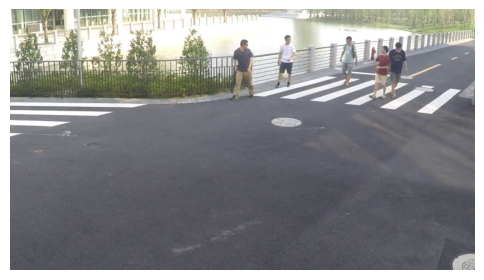

5 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the people are just standing or walking around the street.


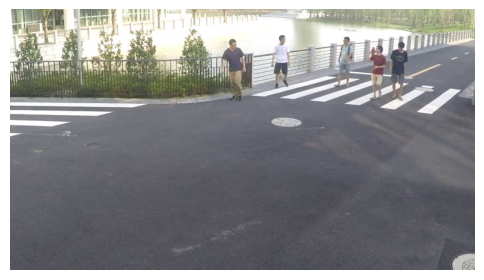

6 0.5
The image shows a group of people walking across a street, but there is no evidence of fighting. Although there are several people in close proximity, they appear to be peacefully crossing the street. The presence of a bicycle and a backpack suggests that they might be commuters or travelers, but there is no indication of aggression or conflict.


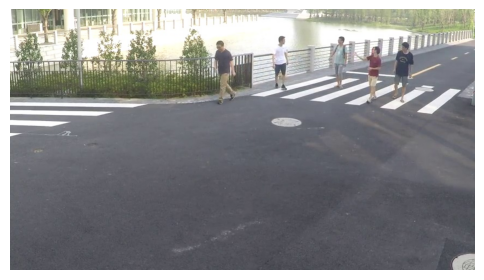

7 0.5
The image shows a group of people walking on a sidewalk near a river, but there is no evidence of fighting. The presence of a few people walking together does not necessarily indicate a situation of conflict or aggression.


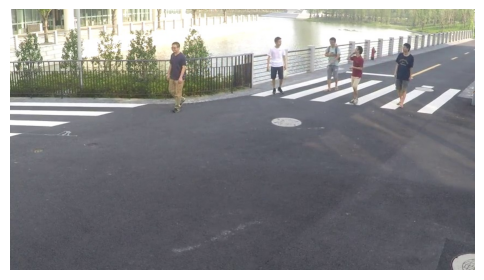

8 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the people are just standing or walking around.


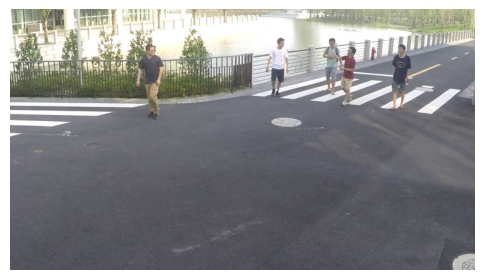

9 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the people are just standing or walking around in the area.


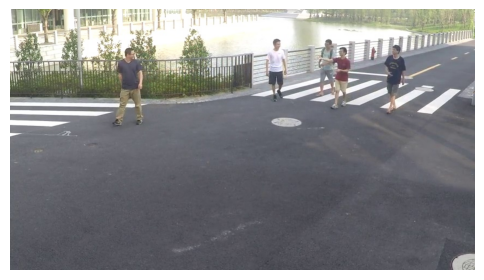

10 The image shows a group of young men playing with a frisbee in a parking lot, and there is no evidence of fighting. Therefore, the score is 0.5.


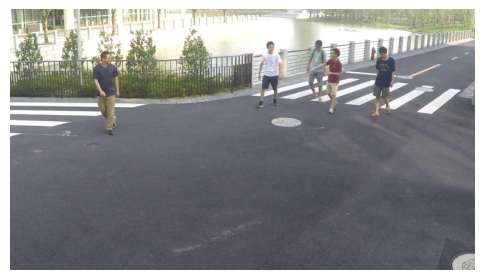

11 0.5
The image shows a group of young people gathered in a parking lot, but there is no evidence of fighting. Although some people are standing close to each other, they appear to be engaged in conversation or other activities rather than fighting. The presence of a skateboard and a backpack suggests that they might be teenagers hanging out, but there is no aggressive behavior or physical altercations taking place in the scene.


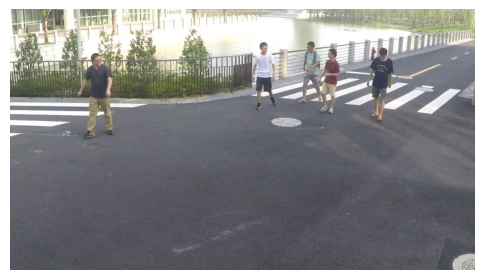

12 0.5
The image shows a group of people gathered in a parking lot, but there is no evidence of fighting. Although there is a disagreement or conflict among the group, it does not escalate to physical violence, so the score is 0.5.


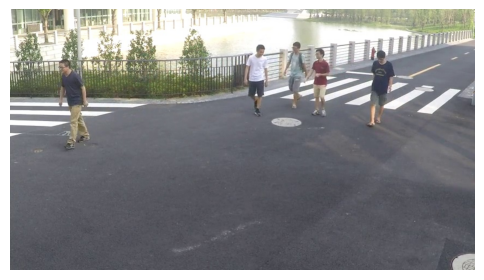

13 0.5
The image shows a group of people walking and standing on a paved area near a body of water. There is no evidence of fighting, and the main focus is on the people's movement and interactions rather than any aggressive behavior.


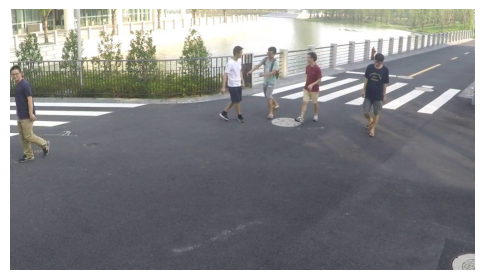

14 0.5
The image shows a group of people walking down a road, but there is no evidence of fighting. Although there are multiple people present, their actions are peaceful and not aggressive.


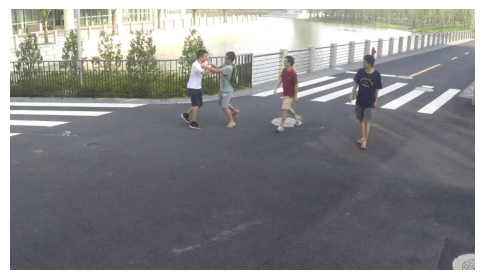

15 The image shows a group of young men playing around and engaging in physical contact, which may give the impression of fighting. However, it is not clear if it is an actual fight or just playful behavior. I would assign a score of 0.8, as there is some physical interaction among the group, but it is not evident that it is an actual fight.


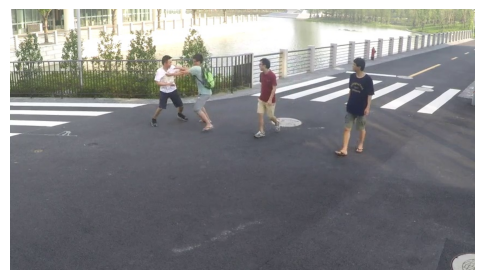

16 The image shows a group of young men playing a fighting game, with one man in a white shirt and green backpack pushing another man in a red shirt to the ground. There is some pushing and shoving, but it is not a full-blown fight. Scoring 0.7, the image shows a physical interaction between the two men, but it does not depict a complete fight.


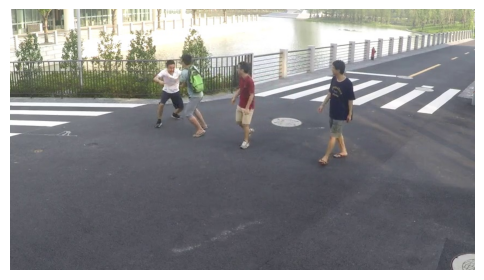

17 The image shows a group of young men playing a game of frisbee on a paved area, with no evidence of fighting. Therefore, the score is 0.0.


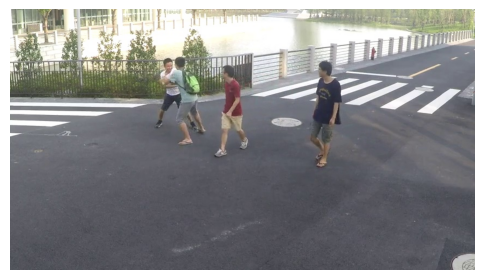

18 0.5
The image shows a group of young men standing on a paved area near a body of water, but there is no evidence of fighting. Although they appear to be gathered and engaged in conversation, their actions do not suggest aggression or conflict.


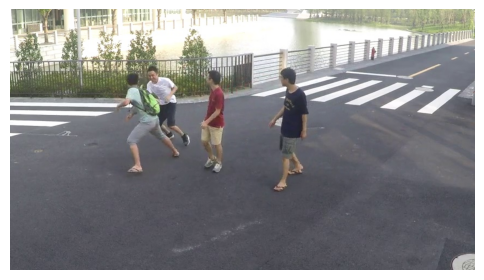

19 The image shows a group of young men playing a game of frisbee, and while there is some physical interaction, it does not appear to be a fight. Therefore, the score is 0.5.


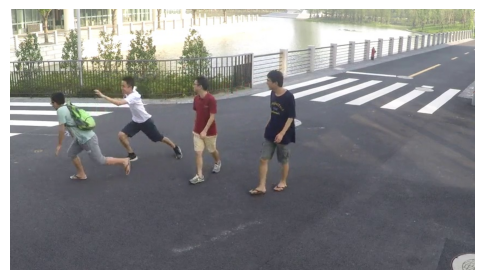

20 The image shows a group of young men playing with a frisbee and engaging in friendly physical activities, such as grabbing and pushing each other. There is no evidence of fighting or aggressive behavior, so the score would be 0.5.


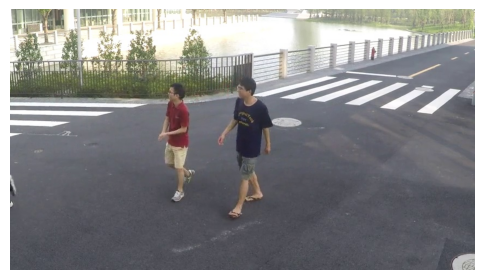

21 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the two men are just walking across the parking lot.


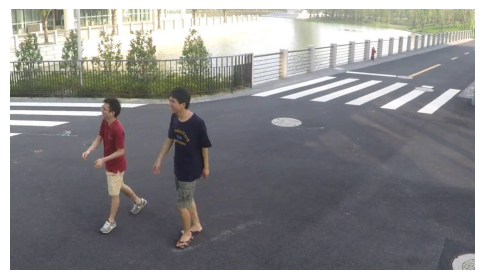

22 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the main focus is on the two young men walking across the parking lot.


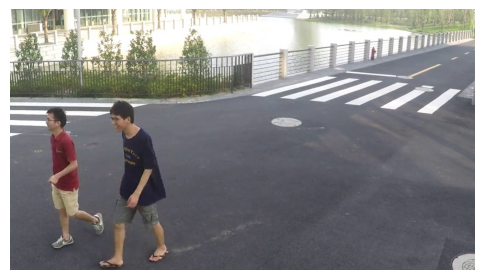

23 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the main focus is on the young man walking down the street with his hand in his pocket.


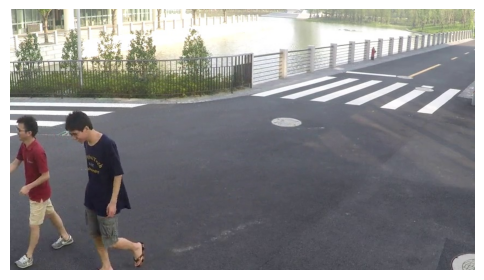

24 The image does not show any fighting, so the score is 0.0. There is a person walking down the street, but there is no evidence of conflict or aggression in the scene.


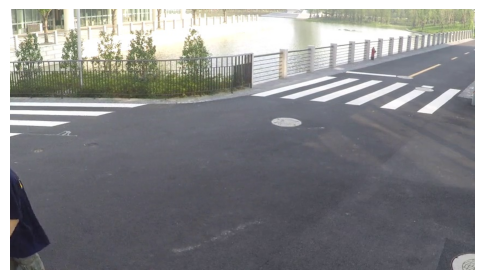

25 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the focus is on the empty road and the two people standing near it.


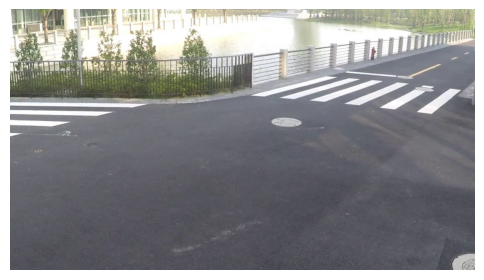

26 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the focus is on the empty road and the surrounding environment.


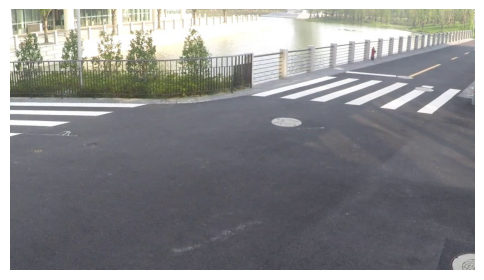

27 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the focus is on the empty road and the bridge.


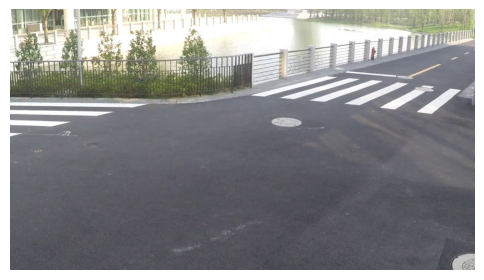

28 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the focus is on the cars and the parking lot.


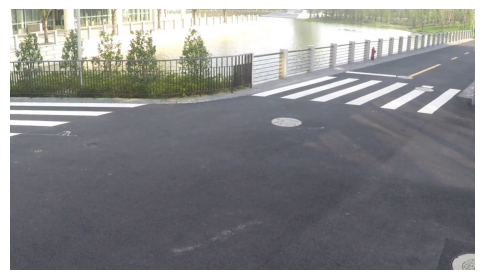

29 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the focus is on the zebra crossing and the person standing near it.


In [ ]:
predicted1 = []
insturuction = make_instruction(keyword)

for i, cp in enumerate(progress_bar(video, total=len(video))):
    # key frame selection
    key_path = key_frame_selection(cp, keyword, clip_model, clip_preprocess, device)

    # Anomaly Detection
    ad_response = lvlm_test(tokenizer, lvlm_model, image_processor, insturuction, key_path, None)
    score = generate_output(ad_response)['score']

    # visualization
    image = Image.open(key_path)
    show_pil_image(image)
    print(i, ad_response)

    # save anomaly score
    for _ in range(clip_length):
        predicted1.append(score)

2. Temporal Context --> Anomaly Detection

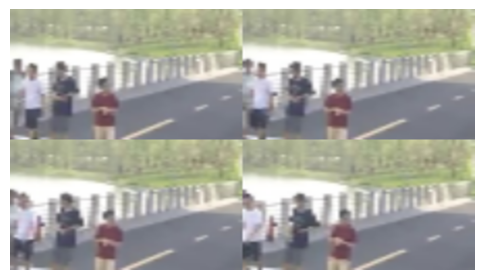

0 The image shows a group of people walking down a sidewalk, and while there is no fighting visible, it is possible that it may occur in the future as the people continue walking. Therefore, I would score this image a 0.8.


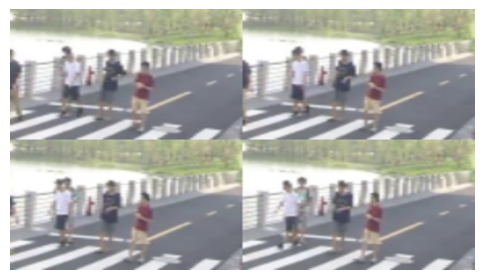

1 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the people are just standing or walking around in different locations.


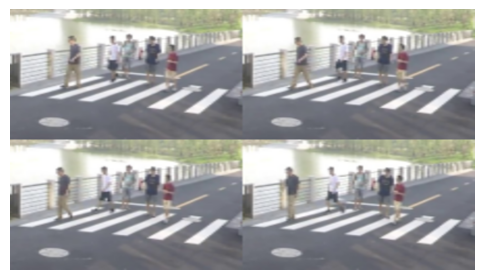

2 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the people are just standing on the bridge.


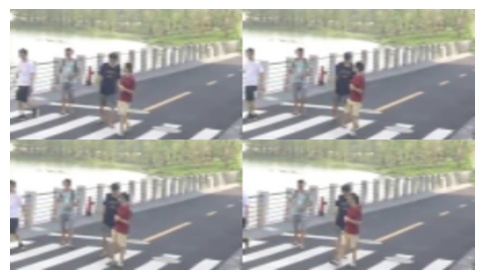

3 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the people are just standing around and talking.


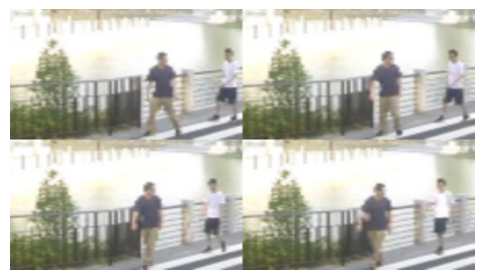

4 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the people are just walking.


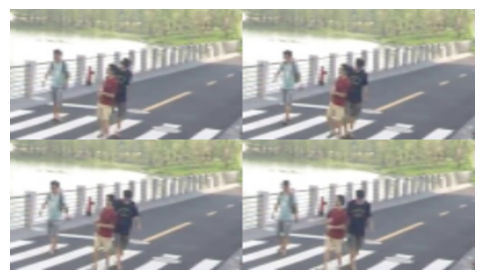

5 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the people are just standing or walking on the sidewalk.


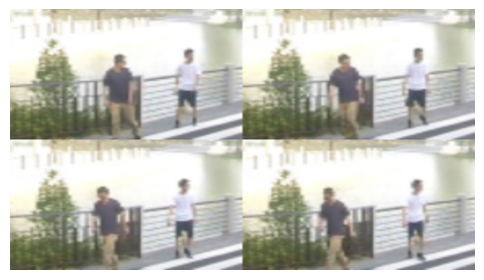

6 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the people are just walking past each other.


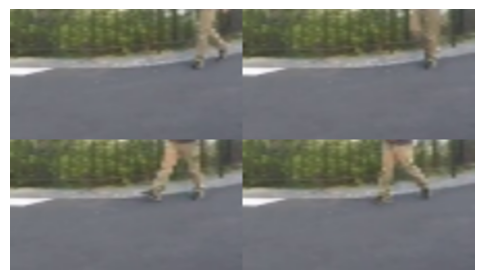

7 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the people are simply walking down the sidewalk.


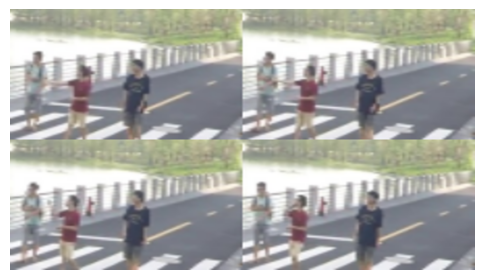

8 The image shows a group of people on a bridge, with some of them interacting aggressively. However, it is not entirely clear if it is a physical fight or just an argument. Scoring 0.8, the image shows signs of potential conflict but not a clear-cut case of fighting.


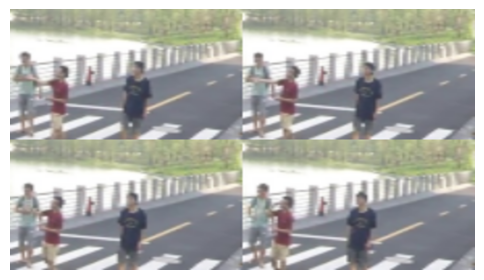

9 The image shows a group of young people on a bridge, with some of them engaging in physical altercations. The score is 0.8, as the fighting is not the main focus of the image, but it is present and can be observed.


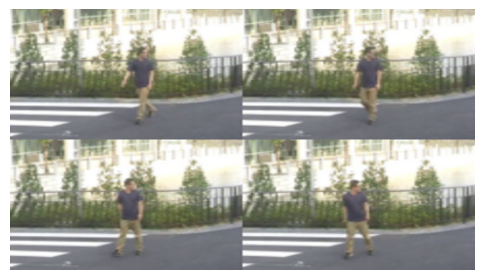

10 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the sequence of events does not depict any aggressive behavior or altercations.


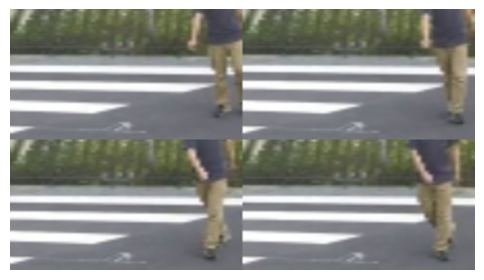

11 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the sequence of events does not depict any aggressive behavior or altercations.


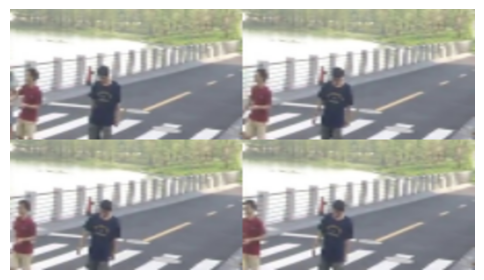

12 The image shows a group of people walking on a sidewalk, and while there is no fighting visible, the score is 0.5 due to the presence of multiple people who could potentially engage in a fight.


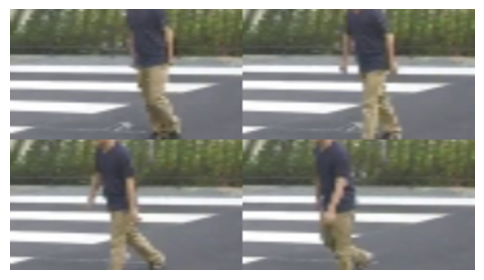

13 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the sequence of events does not depict any aggressive behavior or altercations.


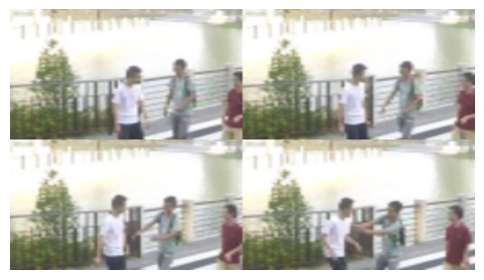

14 The image shows a group of young men standing around a railing, with one man pushing another man's head. There is no clear evidence of a physical fight, but there is some aggressive behavior present. Based on this observation, I would assign a score of 0.7.


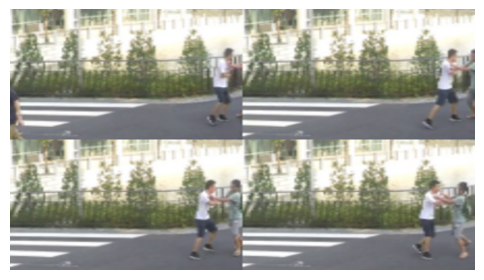

15 The image shows a group of people fighting, with at least two individuals engaged in physical altercations. The score is 1.0, as fighting is clearly present in the image.


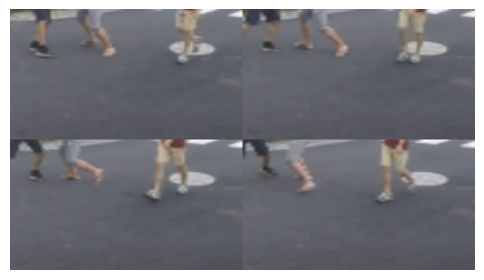

16 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the people are just walking across the street.


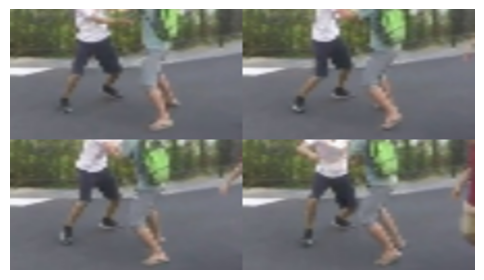

17 The image shows a group of people fighting, with at least two individuals engaged in physical altercations. The score is 1.0, as fighting is clearly present in the image.


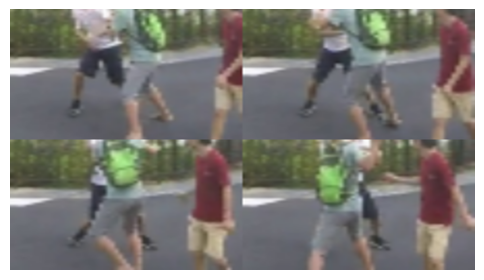

18 The image shows a group of people fighting, with at least two individuals engaged in physical altercations. The score is 0.9 since some fighting is visible, but it is not the main focus of the image.


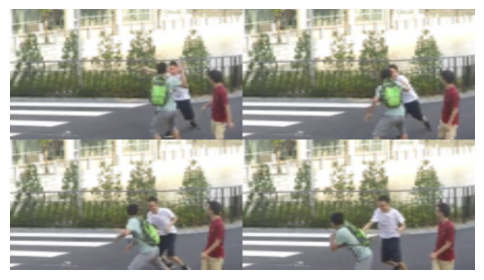

19 The image shows a group of young men fighting in a street, with a score of 0.8. Although the image captures a physical altercation, it is not clear if it is a playful fight or a serious one. The presence of a car in the image might suggest that it is taking place in an urban setting, where such incidents can occur.


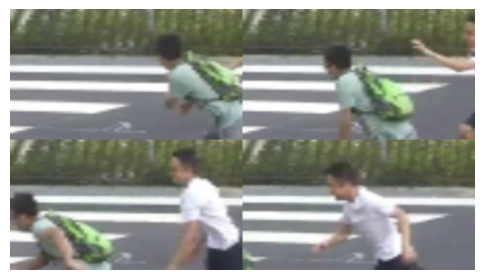

20 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the sequence of pictures only shows people playing with a frisbee.


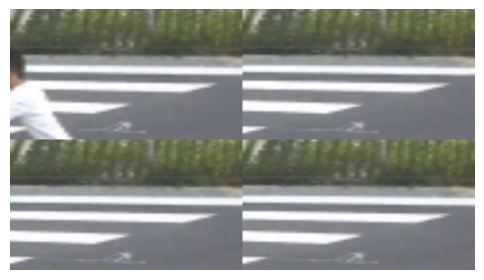

21 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the people are simply walking across the crosswalk.


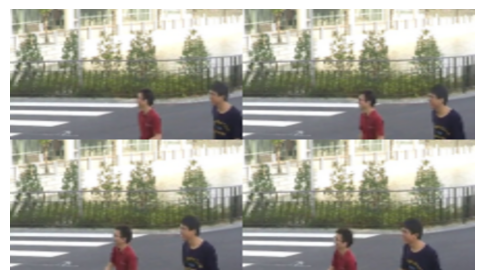

22 The image shows a group of people walking and standing on the street, but there is no evidence of fighting. Therefore, the score is 0.5.


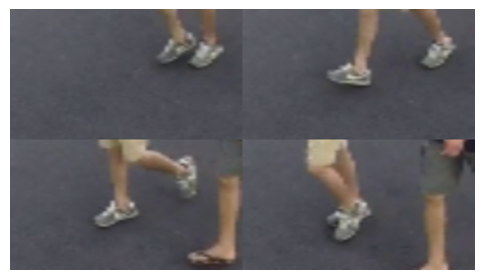

23 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the people are just walking or standing on the sidewalk.


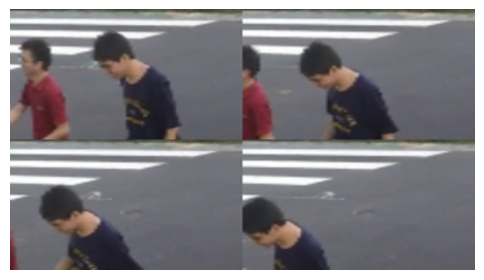

24 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the people are just walking across the street.


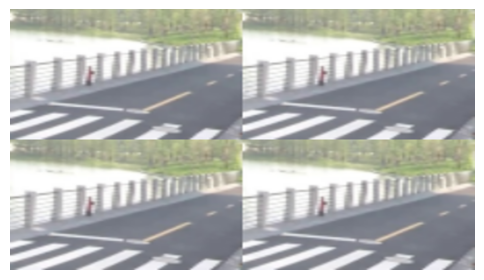

25 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the focus is on the bicycle and the bridge.


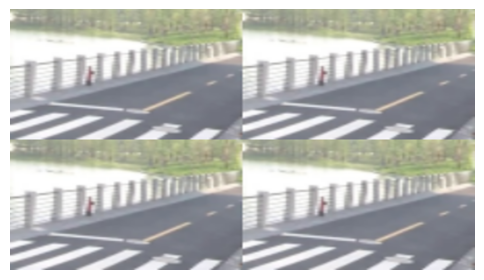

26 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the focus is on the bicycle and the surrounding environment.


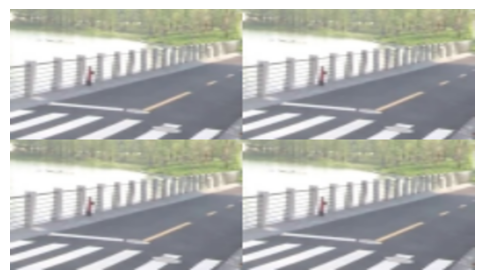

27 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the focus is on the bicycle and the bridge.


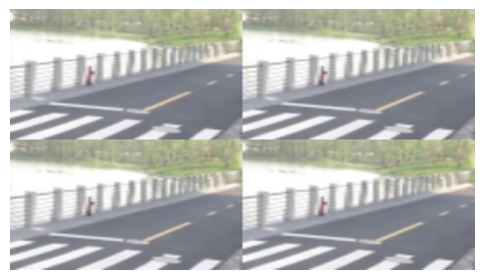

28 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the focus is on the bicycle and the surroundings.


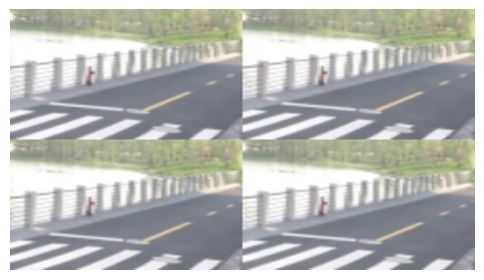

29 The image does not show any fighting, so the score is 0.0. There is no fighting present in the image, and the focus is on the bicycle and the surroundings.


In [ ]:
predicted2 = []
insturuction2 = make_instruction(keyword, True)

for i, clip_path in enumerate(progress_bar(video, total=len(video))):
    # key frames selection
    indice = key_frame_selection_four_idx(clip_length, clip_path, keyword, clip_model, clip_preprocess, device)
    image_paths = [clip_path[idx] for idx in indice]

    # temporal context generation
    grid_image = grid_generation(image_paths, keyword, clip_model, device)

    # Anomaly Detection
    generated_text = lvlm_test(tokenizer, lvlm_model, image_processor, insturuction2, None, grid_image)
    score = generate_output(generated_text)['score']

    # visualization
    show_pil_image(grid_image)
    print(i, generated_text)

    # save anomaly score
    for _ in range(clip_length):
        predicted2.append(score)

AUC comparison

In [ ]:
gt = np.load(video_label_path)[:len(predicted2)]

sigma: 1 auc: 0.7366052631578948


<Figure size 640x480 with 0 Axes>

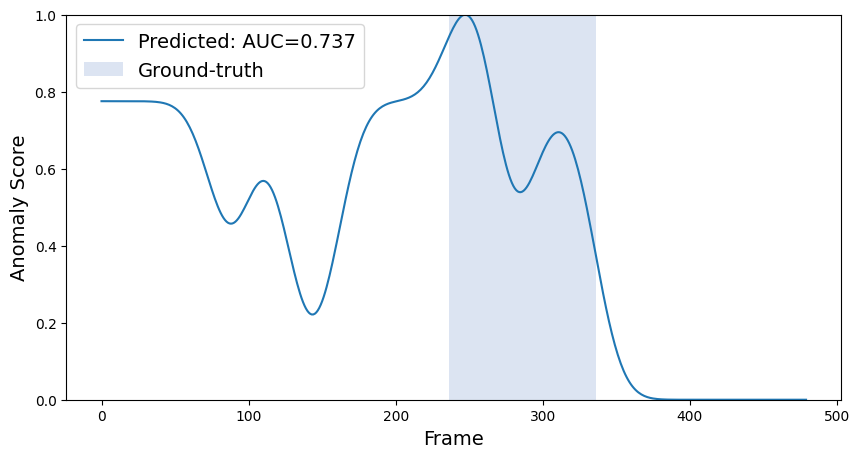

In [ ]:
best_auc1 = 0
for sigma in range(1, 100):
    g_predicted1 = gaussian_filter1d(predicted1, sigma=15)
    mm_predicted1 = min_max_normalize(g_predicted1)

    # get auc
    fpr, tpr, _ = metrics.roc_curve(gt, mm_predicted1, pos_label=1)
    auc1 = metrics.auc(fpr, tpr)

    if auc1 > best_auc1:
        best_sigma1 = sigma
        best_auc1 = auc1
        best_predicted1 = mm_predicted1

# show anomaly scores and AUC
anomalies_idx = [i for i,l in enumerate(gt) if l==1]
print('sigma:',best_sigma1, 'auc:',best_auc1)
show_score_graph(anomalies_idx, best_predicted1, best_auc1)

sigma: 34 auc: 0.9860263157894738


<Figure size 640x480 with 0 Axes>

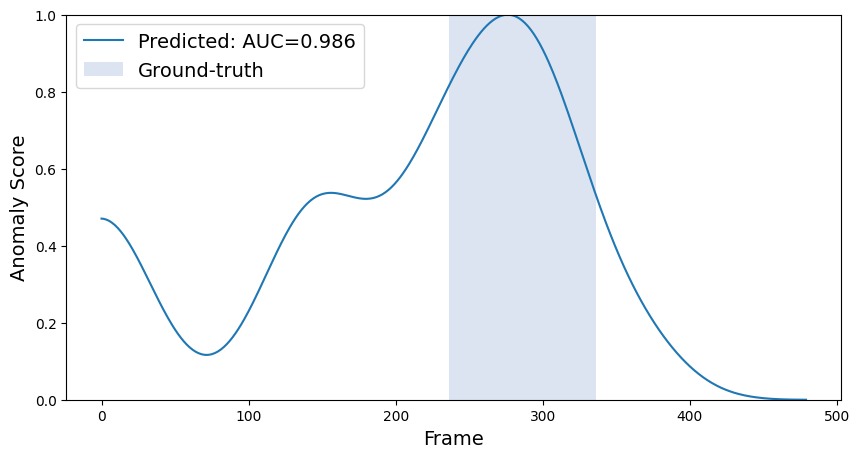

In [ ]:
best_auc2 = 0
for sigma in range(1, 100):
    g_predicted2 = gaussian_filter1d(predicted2, sigma=sigma)
    mm_predicted2 = min_max_normalize(g_predicted2)

    # get auc
    fpr, tpr, _ = metrics.roc_curve(gt, mm_predicted2, pos_label=1)
    auc2 = metrics.auc(fpr, tpr)

    # show
    if auc2 > best_auc2:
        best_sigma2 = sigma
        best_auc2 = auc2
        best_predicted2 = mm_predicted2

# show anomaly scores and AUC
anomalies_idx = [i for i,l in enumerate(gt) if l==1]
print('sigma:',best_sigma2, 'auc:',best_auc2)
show_score_graph(anomalies_idx, best_predicted2, best_auc2)

<Figure size 640x480 with 0 Axes>

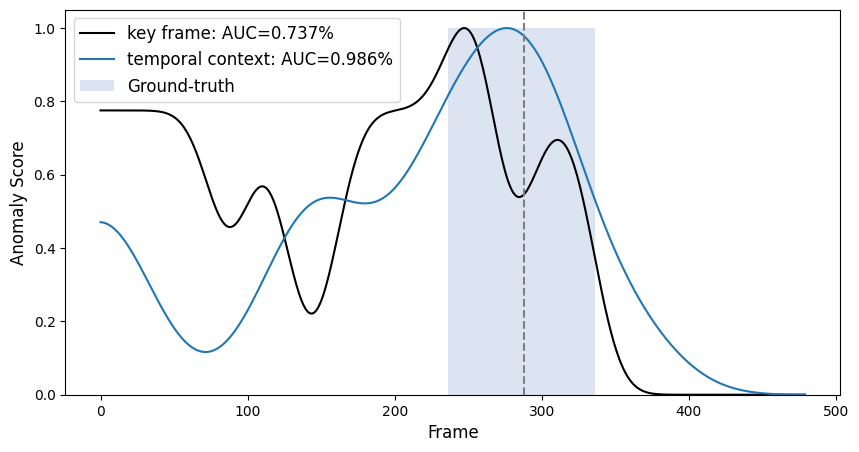

In [ ]:
length = len(best_predicted1)
plt.clf()
plt.figure(figsize=(10, 5))
plt.plot([num for num in range(length)],[score for score in best_predicted1], label=f'key frame: AUC={best_auc1:.3f}%', color='black') # plotting
plt.plot([num for num in range(length)],[score for score in best_predicted2], label=f'temporal context: AUC={best_auc2:.3f}%') # plotting
plt.bar(anomalies_idx, 1, width=1, color='#BBCBE7',alpha=0.5, label='Ground-truth') # check answer
plt.xlabel('Frame', fontsize=12)
plt.ylabel('Anomaly Score', fontsize=12)
plt.legend(fontsize=12, loc='upper left')

x_coord = 288
plt.axvline(x=x_coord, color='gray', linestyle='--', linewidth=1.5)